# LIME with tabular data

## Load data, train a model

In [1]:
import sklearn.datasets

iris = sklearn.datasets.load_iris()
X, y = iris.data, iris.target

In [2]:
import pandas as pd

X = pd.DataFrame(X, columns=iris.feature_names)
X.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [3]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=42)

In [4]:
y_train.shape, y_test.shape

((120,), (30,))

In [5]:
cols = {
    "PL": "petal length (cm)",
    "PW": "petal width (cm)",
    "SL": "sepal length (cm)",
    "SW": "sepal width (cm)",
}

Plot the training and test sets. Training points are marked with a dot, and test points are marked with a star.

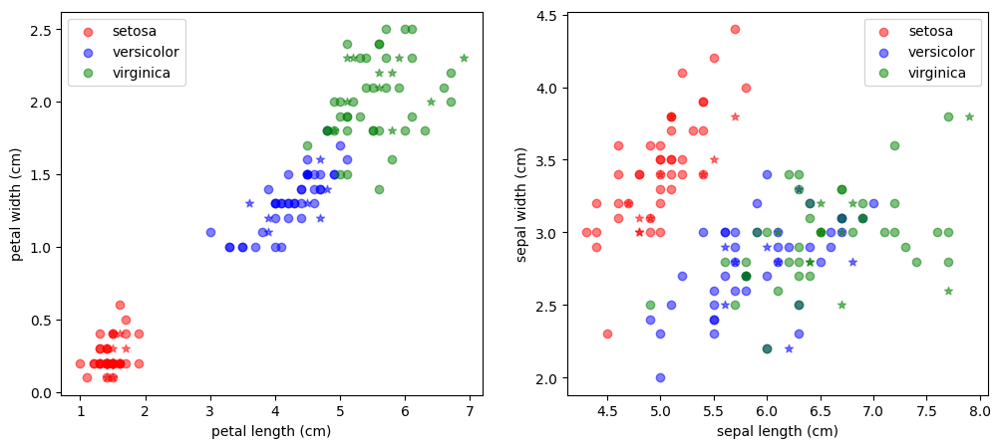

In [6]:
import matplotlib.pyplot as plt

def plot_two_features(feat1: str, feat2: str, ax=None):
  if ax is None:
    ax = plt.gca()

  for y_, color in enumerate(['r', 'b', 'g']):
      ax.scatter(X_train.loc[y_train == y_, feat1],
                 X_train.loc[y_train == y_, feat2],
                 c=color, alpha=0.5, label=iris.target_names[y_])
      ax.scatter(X_test.loc[y_test == y_, feat1],
                 X_test.loc[y_test == y_, feat2],
                 c=color, alpha=0.5, marker='*')
  ax.legend(loc='best')
  ax.set_xlabel(feat1)
  ax.set_ylabel(feat2)
  return


fig, ax = plt.subplots(1, 2, figsize=(12, 5))
plot_two_features(cols["PL"], cols["PW"], ax[0])
plot_two_features(cols["SL"], cols["SW"], ax[1])

Train and evaluate a classifier

In [8]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier()

clf.fit(X_train.values, y_train)

RandomForestClassifier()

In [9]:
from sklearn import metrics

y_pred = clf.predict(X_test.values)
metrics.accuracy_score(y_test, y_pred)

1.0

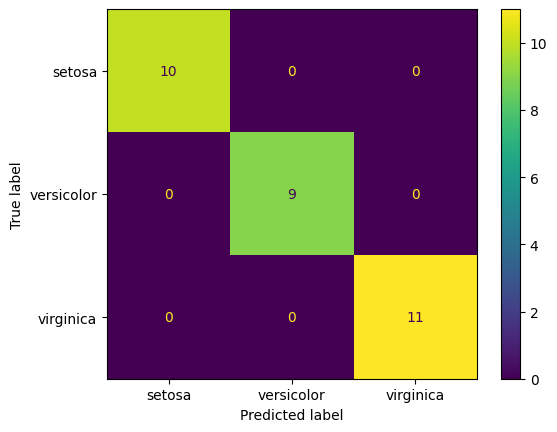

In [10]:
cm = metrics.confusion_matrix(y_test, y_pred)
metrics.ConfusionMatrixDisplay(cm, display_labels=iris.target_names).plot();

### predict_proba

In a scikit-learn classifier, `predict_proba()` returns the probability of each class for test samples. For comparison, `predict()` assigns the most likely class to each sample.

In [11]:
y_pred_proba = clf.predict_proba(X_test.values)
y_pred_proba[:10]

array([[0.  , 0.97, 0.03],
       [1.  , 0.  , 0.  ],
       [0.  , 0.02, 0.98],
       [0.  , 1.  , 0.  ],
       [0.  , 0.86, 0.14],
       [1.  , 0.  , 0.  ],
       [0.  , 1.  , 0.  ],
       [0.  , 0.05, 0.95],
       [0.  , 0.91, 0.09],
       [0.  , 1.  , 0.  ]])

For any data point, the "`predict()` class" always corresponds to the most likely "`predict_proba()` class".

In [12]:
y_pred_proba.argmax(axis=1)

array([1, 0, 2, 1, 1, 0, 1, 2, 1, 1, 2, 0, 0, 0, 0, 1, 2, 1, 1, 2, 0, 2,
       0, 2, 2, 2, 2, 2, 0, 0])

In [13]:
(y_pred_proba.argmax(axis=1) == y_pred).all()

np.True_

## Explanations with LIME

In [14]:
!pip -q install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 12.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


Instantiate the dedicated explainer for **tabular** data with the following arguments:

*   `training_data`: a numpy array with shape `(n_rows, n_features)`, *required*
*   `feature_names`: list of names (strings) corresponding to the columns in the training data, to improve the readability of the explanation. If `None`, each feature is referred to with its positional index;
*   `class_names`: list of names (strings) corresponding to the labels, to improve the readability of the explanation. If `None`, classes will be *0*, *1*...;
*   `random_state`: the seed to make experiment repeatable;
*   `discretizer`: to discretize numerical columns. Instead of quartiles or deciles, we pick `'entropy'`;
*   `training_labels`: required by `discretizer='entropy'`.

In [15]:
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=iris.feature_names,
    class_names=iris.target_names,
    random_state=42,
    discretizer='entropy', training_labels=y_train,
)

### Generate a local explanation

To explain a single prediction, use `explain_instance()`.

The arguments are:

  * `data_row`: The instance to be explained. It must be a NumPy array with shape `(n_features,)`;
  * `predict_fn`: For ScikitLearn classifiers, `predict_proba()`;
  * `num_features`: The maximum number of features to include in the explanation;
  * `top_labels`: if not `None`, include the K most likely labels in the explanation.

In [16]:
i = 14
exp = explainer.explain_instance(
    X_test.values[i],
    clf.predict_proba,
    num_features=len(iris.feature_names),
    top_labels=3
)
exp.show_in_notebook()

This is a qualitative way to read an explanation: "According to LIME, our classifier learned that, if `petal_width <= 0.80`, this is an indication in favor of *setosa*, and relatively stronger compared to other indications".

Following the same logic, `petal_length` (its value in this data point) gives a strong indication in favor of *setosa* as well, while `sepal_length` and `sepal_width` played almost no role in the decision.

We trust what LIME says about our classifier. Now that we have a human-understandable insight on what the classifier learned, we need to check whether it actually learned the right way.

Plot the dataset again, and highlight the point being explained:

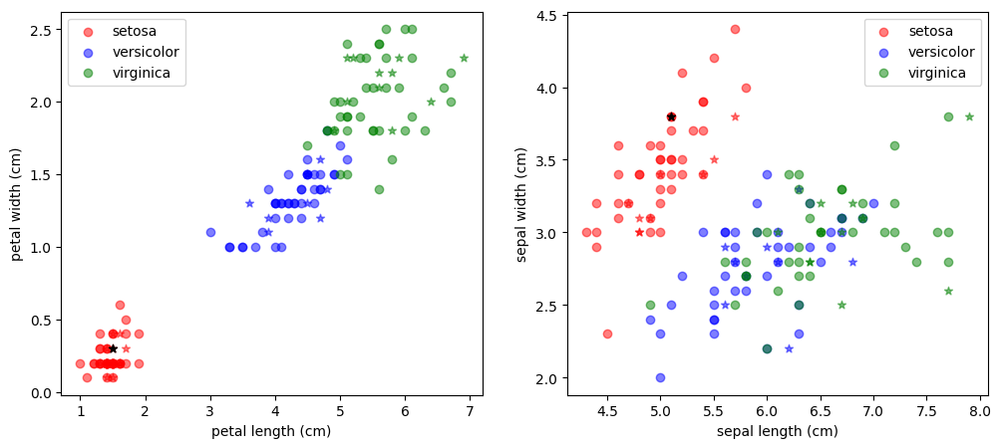

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
plot_two_features(cols["PL"], cols["PW"], ax[0])
plot_two_features(cols["SL"], cols["SW"], ax[1])
ax[0].scatter(*X_test[[cols['PL'], cols['PW']]].iloc[i], marker='*', color='k')
ax[1].scatter(*X_test[[cols['SL'], cols['SW']]].iloc[i], marker='*', color='k')
plt.show()

Inspect the model on an edge case:

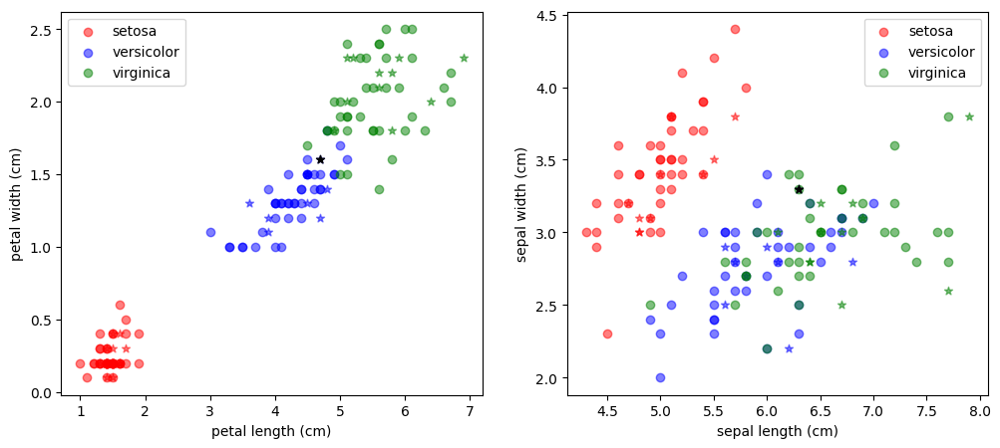

In [18]:
i = 15
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
plot_two_features(cols["PL"], cols["PW"], ax[0])
plot_two_features(cols["SL"], cols["SW"], ax[1])
ax[0].scatter(*X_test[[cols['PL'], cols['PW']]].iloc[i], marker='*', color='k')
ax[1].scatter(*X_test[[cols['SL'], cols['SW']]].iloc[i], marker='*', color='k')
plt.show()

In [21]:
iris.target_names[y_test[i]]

np.str_('versicolor')

In [19]:
exp = explainer.explain_instance(
    X_test.values[i],
    clf.predict_proba,
    num_features=len(iris.feature_names),
    top_labels=3
)
exp.show_in_notebook()

The classifier seems to be basically ignoring the sepal columns. However, or *setosa*, sepal columns should be informative as well.

Let's test the classifier with an artificial *setosa* "corner case", by increasing the petal dimensions closer to that of *versicolor.*

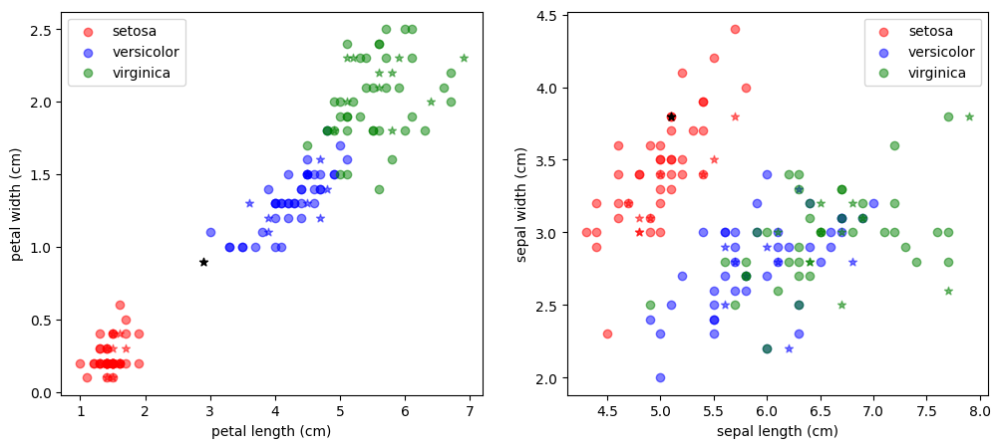

In [29]:
i = 14
x = X_test.iloc[i].copy()
# x[[cols['PL'], cols['PW']]] = 2.5, 0.75
# x[[cols['PL'], cols['PW']]] = 2.9, 0.75
# x[[cols['PL'], cols['PW']]] = 2.5, 0.9
x[[cols['PL'], cols['PW']]] = 2.9, 0.9

fig, ax = plt.subplots(1, 2, figsize=(12, 5))
plot_two_features(cols["PL"], cols["PW"], ax[0])
plot_two_features(cols["SL"], cols["SW"], ax[1])
ax[0].scatter(*x[[cols['PL'], cols['PW']]], marker='*', color='k')
ax[1].scatter(*x[[cols['SL'], cols['SW']]], marker='*', color='k')
plt.show()

In [30]:
exp = explainer.explain_instance(
    x.values,
    clf.predict_proba,
    num_features=len(iris.feature_names),
    top_labels=3
)
exp.show_in_notebook()

Let's alter the sepal columns instead.

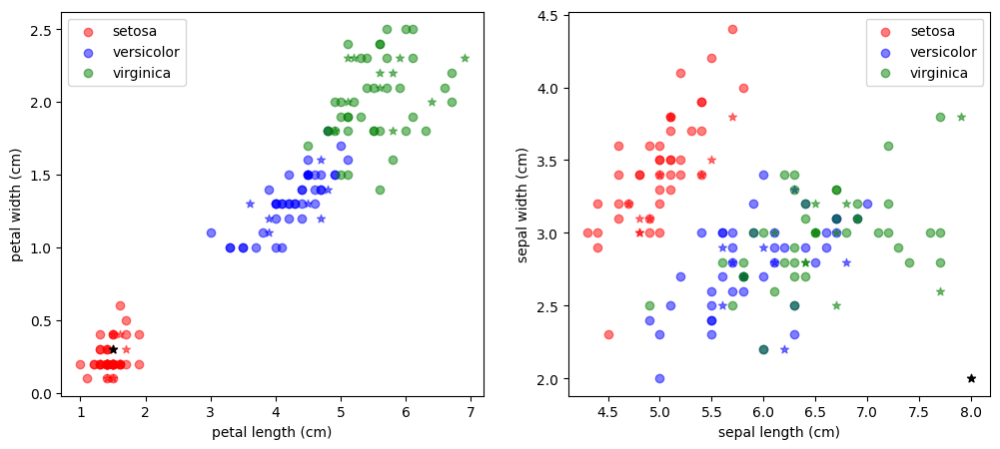

In [33]:
x = X_test.iloc[i].copy()
# x[[cols['SL'], cols['SW']]] = 6.5, 3.0
x[[cols['SL'], cols['SW']]] = 8.0, 2.0

fig, ax = plt.subplots(1, 2, figsize=(12, 5))
plot_two_features(cols["PL"], cols["PW"], ax[0])
plot_two_features(cols["SL"], cols["SW"], ax[1])
ax[0].scatter(*x[[cols['PL'], cols['PW']]], marker='*', color='k')
ax[1].scatter(*x[[cols['SL'], cols['SW']]], marker='*', color='k')
plt.show()

In [34]:
exp = explainer.explain_instance(
    x.values,
    clf.predict_proba,
    num_features=len(iris.feature_names),
    top_labels=3
)
exp.show_in_notebook()

By reconstructing its behaviour, we learned that this classifier overfits on the petal and makes no use of the sepal, which can be informative as well. Despite reaching 100% accuracy, the model is sensitive to potential incoming outliers.

Let's try a different classifier:

In [35]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import make_pipeline

clf = make_pipeline(MinMaxScaler(), LogisticRegression())
clf.fit(X_train.values, y_train)

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('logisticregression', LogisticRegression())])

In [36]:
y_pred = clf.predict(X_test.values)
metrics.accuracy_score(y_test, y_pred)

0.9666666666666667

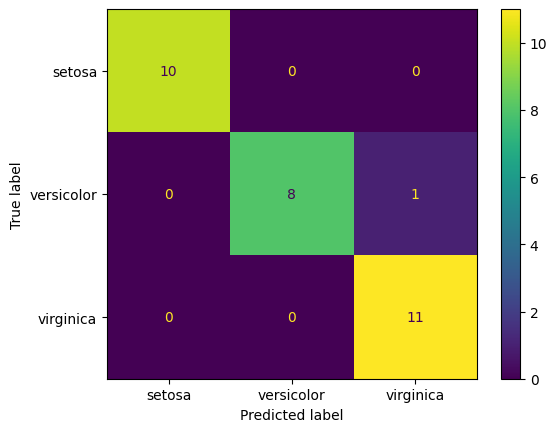

In [37]:
cm = metrics.confusion_matrix(y_test, y_pred)
metrics.ConfusionMatrixDisplay(cm, display_labels=iris.target_names).plot();

In [38]:
i = 14
exp = explainer.explain_instance(
    X_test.values[i],
    clf.predict_proba,
    num_features=len(iris.feature_names),
    top_labels=3
)
exp.show_in_notebook()

In [42]:
i = 14
x = X_test.iloc[i].copy()
# x[[cols['PL'], cols['PW']]] = 2.5, 0.75
# x[[cols['PL'], cols['PW']]] = 2.9, 0.75
# x[[cols['PL'], cols['PW']]] = 2.5, 0.9
x[[cols['PL'], cols['PW']]] = 2.9, 0.9

exp = explainer.explain_instance(
    x.values,
    clf.predict_proba,
    num_features=len(iris.feature_names),
    top_labels=3
)
exp.show_in_notebook()

In [43]:
i = 15
exp = explainer.explain_instance(
    X_test.values[i],
    clf.predict_proba,
    num_features=len(iris.feature_names),
    top_labels=3
)
exp.show_in_notebook()

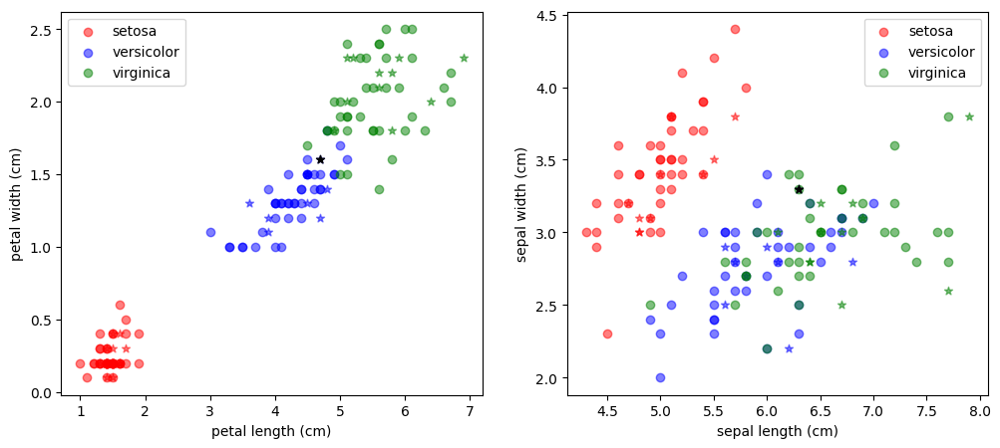

In [44]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
plot_two_features(cols["PL"], cols["PW"], ax[0])
plot_two_features(cols["SL"], cols["SW"], ax[1])
ax[0].scatter(*X_test[[cols['PL'], cols['PW']]].iloc[i], marker='*', color='k')
ax[1].scatter(*X_test[[cols['SL'], cols['SW']]].iloc[i], marker='*', color='k')
plt.show()